# **Hand Pose Estimation with YOLO11 Using the OneHand10K Dataset**

This notebook presents a complete pipeline for hand pose estimation, where the [YOLO-pose](https://docs.ultralytics.com/tasks/pose/#models) model is fine-tuned using the [OneHand10K](https://www.yangangwang.com/papers/WANG-MCC-2018-10.html) dataset.

The **YOLO-pose** model was originally pretrained on the [COCO-Pose](https://cocodataset.org/#keypoints-2017) dataset, which is designed for human pose estimation with 17 annotated keypoints per person. **COCO-Pose** consists of 56,599 training images, 2,346 validation images, and 20,288 test images (with test annotations not publicly available). Its large scale and diversity make it a strong foundation for general-purpose pose estimation tasks.

The **OneHand10K** dataset contains 10,000 training images and 1,703 test images, each depicting a single hand annotated with **21 keypoints**. Despite being specifically tailored for single-hand pose estimation, the fine-tuned **YOLO-pose** model is also capable of detecting and estimating multiple hands within an image, as will be demonstrated later.

## **Imports**

In [ ]:
# Installation of the Ultralytics library
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 63.2 MB/s eta 0:00:00


In [2]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from PIL import Image
from google.colab import drive
from dataclasses import dataclass
from glob import glob
from IPython.display import display, Video
import subprocess
import yaml
import cv2
import os

# Necessary in Colab with Ultralytics to prevent path-related encoding errors
import locale
locale.getpreferredencoding = lambda: "UTF-8"

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
# Mount Google Drive in Colab
drive.mount("/content/drive/", force_remount=True)

Mounted at /content/drive/


## **Configuration**

In [ ]:
@dataclass()
class Config():
    """
    Configuration class for training the YOLO-pose model on the OneHand10K dataset.
    Centralizes paths, hyperparameters, and training options.
    """
    model_name   : str   = "yolo11s-pose.pt"
    data_zip_path: str   = "/content/drive/MyDrive/Datasets/OneHand10K.zip"
    project_dir  : str   = "/content/drive/MyDrive/Ultralytics"

    resume       : bool  = True
    epochs       : int   = 150
    batch_size   : int   = 32
    imgsz        : int   = 640
    patience     : int   = 15
    close_mosaic : int   = 30

    optimizer    : str   = "AdamW"
    lr0          : float = 5e-4
    lrf          : float = 1e-2
    momentum     : float = 0.9

config = Config()

config.data_dir = os.path.basename(config.data_zip_path).split(".")[0]
config.project_name = os.path.join(config.project_dir, "HandPoseEstimation_YOLO11s_OneHand10K")

## **Load Preprocessed Dataset**

The download, preprocessing, and detailed analysis of the **OneHand10K** dataset have been completed in the following notebook: [**Preprocessing_OneHand10K**](https://github.com/JersonGB22/PoseEstimation-TensorFlow-PyTorch/blob/main/Preprocessing/Preprocessing_OneHand10K.ipynb).

In [5]:
# Unzip the preprocessed dataset
!unzip -q {config.data_zip_path}

In [ ]:
# Load dataset metadata
with open(os.path.join(config.data_dir, "data.yaml"), "r") as f:
    metadata = yaml.safe_load(f)

for k, v in metadata["skeleton"].items():
    print(f"{k:<17}: {v}")

wrist            : {'ids': [0, 0], 'color': [100, 100, 100]}
thumb_cmc        : {'ids': [1, 0], 'color': [0, 0, 100]}
thumb_mcp        : {'ids': [2, 1], 'color': [0, 0, 150]}
thumb_ip         : {'ids': [3, 2], 'color': [0, 0, 200]}
thumb_tip        : {'ids': [4, 3], 'color': [0, 0, 255]}
index_finger_mcp : {'ids': [5, 0], 'color': [0, 100, 100]}
index_finger_pip : {'ids': [6, 5], 'color': [0, 150, 150]}
index_finger_dip : {'ids': [7, 6], 'color': [0, 200, 200]}
index_finger_tip : {'ids': [8, 7], 'color': [0, 255, 255]}
middle_finger_mcp: {'ids': [9, 0], 'color': [50, 100, 0]}
middle_finger_pip: {'ids': [10, 9], 'color': [75, 150, 0]}
middle_finger_dip: {'ids': [11, 10], 'color': [100, 200, 0]}
middle_finger_tip: {'ids': [12, 11], 'color': [125, 255, 0]}
ring_finger_mcp  : {'ids': [13, 0], 'color': [100, 50, 0]}
ring_finger_pip  : {'ids': [14, 13], 'color': [150, 75, 0]}
ring_finger_dip  : {'ids': [15, 14], 'color': [200, 100, 0]}
ring_finger_tip  : {'ids': [16, 15], 'color': [255, 125,

## **Training and Evaluation of the Model**

### **Metrics**

Before introducing the metrics used by **YOLO-pose** for evaluation, it is important to review the fundamental metrics on which they are based.

#### **Intersection over Union (IoU)**

In object detection, IoU measures the ratio between the intersection area and the union area of the ground-truth and predicted bounding boxes for an instance.

#### **[Object Keypoint Similarity (OKS)](https://cocodataset.org/#keypoints-eval)**

Measures the similarity between a set of predicted and ground-truth keypoints, penalizing discrepancies based on the object's scale. It is analogous to IoU in object detection and image segmentation, but instead of comparing areas, it compares distances between keypoints.

**Formula:**

$$
OKS =
\frac{
  \sum_{i=1}^{N} \exp{\left(\frac{-d_i^2}{2s^2(2\sigma_i)^2}\right)} \, \delta(v_i>0)
}{
  \sum_{i=1}^{N} \delta(v_i>0)
}
$$

where:

* $N$ is the total number of labeled keypoints per instance. In the **OneHand10K** dataset, each hand has at most **21 annotated keypoints**.

* $d_i$ is the Euclidean distance between the ground-truth and predicted keypoint $i$.

* $s = \sqrt{\text{area}}$ represents the object scale, defined as the square root of the segmented area. In **Ultralytics**, this segmented area is heuristically approximated as [0.53](https://github.com/ultralytics/ultralytics/blob/11bafb2613d4f9dc95934847f4ea6667f42a5657/ultralytics/models/yolo/pose/val.py#L197) times the bounding box area.

* $\sigma_i$ is the standard deviation assigned to each keypoint relative to the object scale $s$. Since the **OneHand10K** dataset does not provide official $\sigma_i$ values, **Ultralytics** assigns each keypoint a uniform value of [$\frac{1}{N}$](https://github.com/ultralytics/ultralytics/blob/0a84dc67ed9a61de1abae552f017e8099c7aa3f4/ultralytics/models/yolo/pose/val.py#L117).

  However, this approach should be applied with caution:

  * In datasets with a large number of keypoints ($N > 25$), the resulting $\sigma_i$ values tend to be too small. In this case, the OKS metric becomes overly strict, disproportionately penalizing even minimal prediction errors.
  * In datasets with a small number of keypoints ($N < 10$), the opposite occurs: $\sigma_i$ becomes too large, making the OKS metric overly permissive and tolerant of significant errors without adequate penalization.

  Therefore, in scenarios where the number of keypoints is very high or very low, it is strictly necessary to compute $\sigma_i$ specifically for each keypoint, ideally based on anatomical variability and the relative scale of the object parts. Otherwise, the Ultralytics approach may yield misleading results, as highlighted in discussions such as [this forum report](https://github.com/ultralytics/ultralytics/issues/2543).
  
* $\delta(v_i>0)$ is the indicator function, which equals 1 if keypoint $i$ is annotated, and 0 otherwise. 


#### **Metrics used by YOLO-pose for evaluation**

* **Precision:** measures the proportion of correct predictions among all predictions made by the model:

  $$
  \text{Precision} = \frac{\text{TP}}{\text{TP} + \text{FP}}
  $$

  A prediction is considered a **true positive (TP)** if the predicted and ground-truth bounding boxes exceed a given **IoU** threshold in object detection, or if the predicted and ground-truth keypoints exceed a given **OKS** threshold in pose estimation. Otherwise, the prediction is counted as a **false positive (FP)**, while unmatched ground-truth instances are counted as **false negatives (FN)**.

* **Recall:** measures the proportion of correct predictions among all ground-truth instances:

  $$
  \text{Recall} = \frac{\text{TP}}{\text{TP} + \text{FN}}
  $$

* **mAP50:** the mean Average Precision (AP) across all classes, computed at a fixed threshold of 0.5. AP corresponds to the area under the precision–recall curve.

* **mAP50–95:** similar to mAP50, but averaging results over multiple thresholds ranging from 0.5 to 0.95 with a step of 0.05. This provides a more comprehensive evaluation of model performance across different precision levels in both object detection and pose estimation.


**All these metrics range from 0 to 1, with 1 indicating perfect performance.**

### **[Losses](https://github.com/ultralytics/ultralytics/blob/main/ultralytics/utils/loss.py)**

During training, the **YOLO-pose** model optimizes the following five loss components:

- **box_loss**: This is the **Complete Intersection over Union (CIoU) Loss**. This loss function considers not only the overlap between the predicted and actual bounding boxes but also the distance between their centers and the aspect ratio. This makes it a more thorough metric for assessing box alignment. It surpasses the performance of IoU (Intersection over Union), GIoU (Generalized IoU), and DIoU (Distance IoU) losses.

- **pose_loss**: Defined as **1 - OKS**, it penalizes inaccuracies in the localization of keypoint coordinates. In this case, the scale $s$ for each instance is computed as the square root of its bounding box area, rather than the square root of its segmentation area.

- **kobj_loss**: A **Binary Cross-Entropy (BCE) loss with logits**, used to classify the visibility of each keypoint. 

- **cls_loss**: Another **Binary Cross-Entropy loss with logits** applied to the model's class predictions.

- **dfl_loss**: This refers to the **Distribution Focal Loss (DFL)**, an enhanced variant of the focal loss aimed at giving greater emphasis to difficult-to-classify instances. It modifies the focal loss according to the class distribution, enhancing the model's sensitivity to minority classes and helping to address class imbalance.

In [ ]:
# Load last checkpoint if resuming, otherwise load pretrained model
if config.resume:
  model = YOLO(os.path.join(config.project_name, "weights/last.pt"))
else:
  model = YOLO(config.model_name)

model.info()

YOLO11s-pose summary: 196 layers, 10,056,226 parameters, 0 gradients, 23.8 GFLOPs


(196, 10056226, 0, 23.8494544)

Unlike conventional pose estimation algorithms, **YOLO-pose** models act as single-stage multi-object keypoint detectors. They are similar to bottom-up approaches but without relying on heatmaps, which makes them faster and more efficient, while also allowing the use of continuous coordinates instead of discrete indices. In this sense, they combine the strengths of both top-down and bottom-up approaches.

In this work, I chose to fine-tune the **YOLO11s-pose** model. After experimenting with both larger versions and the smaller variant, I found that they achieved lower performance and slower convergence on the **OneHand10K** dataset, often overfitting and failing to generalize properly.

Since **YOLO-pose** was pretrained on human pose estimation tasks and **OneHand10K** is specifically designed for hand pose estimation, the model required more epochs to converge. For this reason, I trained it for **150 epochs**. Additionally, because **OneHand10K** contains only one hand per image, the bounding box detector converges much faster than the keypoint estimator. To balance this, I adjusted the loss weights based on experimental results: I reduced the bounding box loss weight from **7.5 to 5.0**, and increased the keypoint localization and keypoint visibility loss weights from **12.0 to 15.0** and from **2.0 to 3.0**, respectively. These modifications helped achieve the best results. I also replaced the automatically calculated initial learning rate provided by Ultralytics with a value of **5e-4**, which yielded significantly better performance.

Finally, I configured mosaic data augmentation to be disabled during the last **30 epochs**, so that the model could better focus on learning to detect and estimate a single hand, in line with the nature of the **OneHand10K** dataset. Nevertheless, since mosaic augmentation was applied during the first **120 epochs**, the model still retained the ability to detect and estimate multiple hands within an image. Of course, for tasks that require higher robustness and accuracy in multi-hand scenarios, it would be advisable not to disable mosaic augmentation (by setting its value to **0**). However, as **OneHand10K** is specifically focused on single-hand images, I prioritized this approach for the current task.

In [ ]:
results = model.train(
    resume=config.resume,
    data=os.path.join(config.data_dir, "data.yaml"),
    epochs=config.epochs,
    patience=config.patience,
    batch=config.batch_size,
    imgsz=config.imgsz,
    box=5.0,
    pose=15.0,
    kobj=3.0,
    optimizer=config.optimizer,
    lr0=config.lr0,
    lrf=config.lrf, # Final learning rate = lr0 * lrf = 5e-6
    momentum=config.momentum,
    close_mosaic=config.close_mosaic,
    deterministic=True, # Allows for reproducibility of the training
    verbose=True, # Enables model evaluation on the validation set immediately after training
    project=config.project_dir,
    name=config.project_name
)

Ultralytics 8.3.189 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=5.0, cache=False, cfg=None, classes=None, close_mosaic=30, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=OneHand10K/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=3.0, line_width=None, lr0=0.0005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/Ultralytics/HandPoseEstimation_YOLO11s_OneHand10K/weights/last.pt, momentum=0.9, mosaic=1.0, multi_scale=False, name=HandPoseEstimation_YOLO11s_OneHand10K, nbs=64, nms=False, opset=None, optimize=Fal

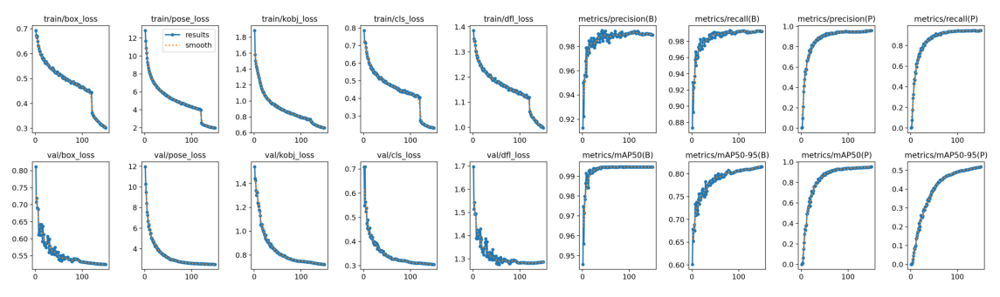

In [75]:
# Loss and Metrics Graphs
plt.figure(figsize=(12, 8))
img = Image.open(os.path.join(config.project_name, "results.png"))
plt.imshow(img)
plt.tight_layout()
plt.axis("off");

## **Inference with the Trained Model**

In [7]:
# Load the trained model
model = YOLO(os.path.join(config.project_name, "weights/best.pt"))

Unfortunately, in Ultralytics, if the task is not human pose estimation and the keypoints do not follow the `[17, 3]` format of **COCO-Pose**, only the keypoint locations are plotted. This significantly limits the ability to understand and visualize the anatomical structure of the keypoints. Furthermore, Ultralytics does not allow passing a `skeleton` variable as an argument to define how to plot keypoints, connection lines, IDs, and dataset-specific (or official) color schemes.

To address these limitations, I implemented a custom class for inference that provides full visualization support:

* **For images**, **Matplotlib** is used, enabling more polished and detailed visualizations, while also supporting multiple predictions in a single frame.
* **For videos**, **OpenCV** is used to accelerate the rendering of frames in real time. Although the plots are less visually refined than those generated with matplotlib, this choice prioritizes efficiency for sequential frame visualization.

In [ ]:
class PoseVisualizer():
    """
    Utility class for visualizing YOLO-pose predictions on images (using Matplotlib) 
    and videos (using OpenCV). It allows rendering keypoints, skeleton connections, keypoints IDs, 
    bounding boxes and classes with customizable options.

    Args:
        model (nn.Module): Fine-tuned YOLO-pose model.
        metadata (dict): Dataset metadata (YAML). Must contain:
            - skeleton: Dictionary with keypoint IDs and RGB colors for each connection.
            - names: Mapping from class IDs to class names.
        config (Config): Configuration object with paths, hyperparameters, and training options.
        kpts_conf_thres (float, optional): Confidence threshold for keypoint visibility. 
            Defaults to 0.25, following Ultralytics' implementation:
            https://github.com/ultralytics/ultralytics/blob/e024959d686a2e4278b6dcbe283447ca3295985a/ultralytics/utils/plotting.py#L406
    """

    def __init__(self, model, metadata, config, kpts_conf_thres=0.25):
        self.model = model
        self.skeleton = metadata["skeleton"]
        self.names = metadata["names"]
        self.config = config
        self.kpts_conf_thres = kpts_conf_thres

    def draw_keypoints(self, ax, keypoints, show_kpts=True, show_lines=True, show_kpts_ids=True):
        """
        Draw keypoints and skeleton connections on a Matplotlib axis.

        Args:
            ax (plt.Axes): Axis to draw on.
            keypoints (np.ndarray): Array of shape (nkpts, 3) with [x, y, confidence] for each keypoint.
            show_kpts (bool, optional): Whether to draw keypoints as circles.
            show_lines (bool, optional): Whether to draw connection lines between keypoints. 
            show_kpts_ids (bool, optional): Whether to display keypoint IDs.
        """
        for dic in self.skeleton.values():
            ids = dic["ids"]
            color = np.array(dic["color"]) / 255

            # Draw connection if both keypoints are visible
            if show_lines and np.all(keypoints[ids, 2] > self.kpts_conf_thres):
                ax.plot(
                    keypoints[ids, 0],
                    keypoints[ids, 1],
                    color=color,
                    linewidth=1.75 if show_kpts_ids else 1.5,
                    zorder=1
                )

            # Draw individual keypoint if visible
            id = ids[0]
            x, y, conf = keypoints[id]
            if conf > self.kpts_conf_thres:
                # Draw keypoint as a circle
                if show_kpts:
                    ax.scatter(
                        x, y,
                        color=color,
                        s=(50 if id > 9 else 40) if show_kpts_ids else 25,
                        zorder=2
                    )

                # Display keypoint ID as label
                if show_kpts_ids:
                    ax.text(
                        x, y, str(id), color="black",
                        fontsize=4.75, fontweight="bold",
                        ha="center", va="center", zorder=3
                    )

    def draw_bbox(self, ax, bbox, height, show_labels=True, show_conf=True):
        """
        Draw a bounding box on a Matplotlib axis.

        Args:
            ax (plt.Axes): Axis to draw on.
            bbox (np.ndarray): Array with [xmin, ymin, xmax, ymax, conf, cls].
            height (int): Image height (used for placing labels).
            show_labels (bool, optional): Whether to show class labels. 
            show_conf (bool, optional): Whether to include confidence score in the label. 
        """
        xmin, ymin, xmax, ymax, conf, cls = bbox
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1.75, edgecolor="red", facecolor="none")
        ax.add_patch(rect)

        if show_labels:
            conf = f" {conf:.2f}" if show_conf else ""
            label = f"{self.names[int(cls)]}{conf}"
            ax.text(
                xmin, ymin, label,
                color="white", fontsize=9, fontweight="semibold",
                ha="left", va="top" if ymin < (0.05 * height) else "bottom",
                bbox={"boxstyle": "square,pad=0", "facecolor": "red", "edgecolor": "red", "alpha": 1.0}
            )

    def draw_keypoints_cv(self, image, keypoints, show_kpts=True, show_lines=True, show_kpts_ids=True):
        """
        Draw keypoints and skeleton connections on an image using OpenCV.

        Args:
            image (np.ndarray): Input image (BGR).
            keypoints (np.ndarray): Array of shape (nkpts, 3) with [x, y, confidence].
            show_kpts (bool, optional): Whether to draw keypoints as circles. 
            show_lines (bool, optional): Whether to draw connection lines between keypoints. 
            show_kpts_ids (bool, optional): Whether to display keypoint IDs. 
        """
        kpts = keypoints[:, :2].astype(np.int32)
        confs = keypoints[:, 2]

        for dic in self.skeleton.values():
            ids = dic["ids"]
            color = dic["color"][::-1] # Convert RGB → BGR

            # Draw connection if both keypoints are visible
            if show_lines and np.all(confs[ids] > self.kpts_conf_thres):
                cv2.line(
                    image, kpts[ids[0]],  kpts[ids[1]], color=color,
                    thickness=2, lineType=cv2.LINE_AA
                )
            
            # Draw individual keypoint if visible
            id = ids[0]
            conf = confs[id]
            if conf > self.kpts_conf_thres:
                x, y = kpts[id]

                # Draw keypoint as a circle
                if show_kpts:
                    cv2.circle(
                        image, (x, y), radius=5, color=color,
                        thickness=-1, lineType=cv2.LINE_AA
                    )
                
                # Display keypoint ID as label
                if show_kpts_ids:
                    cv2.putText(
                        image, str(id), (x, y),
                        fontFace=cv2.FONT_HERSHEY_PLAIN, fontScale=0.75,
                        color=(0, 0, 0), thickness=2, lineType=cv2.LINE_AA
                    )
                    cv2.putText(
                        image, str(id), (x, y),
                        fontFace=cv2.FONT_HERSHEY_PLAIN, fontScale=0.75,
                        color=(255, 255, 255), thickness=1, lineType=cv2.LINE_AA
                    )

    def draw_bbox_cv(self, image, bbox, height, show_labels=True, show_conf=True):
        """
        Draw a bounding box on an image using OpenCV.

        Args:
            image (np.ndarray): Input image (BGR).
            bbox (np.ndarray): Array with [xmin, ymin, xmax, ymax, conf, cls].
            height (int): Image height (used for placing labels).
            show_labels (bool, optional): Whether to show class labels. 
            show_conf (bool, optional): Whether to include confidence score in the label.
        """
        xmin, ymin, xmax, ymax = bbox[:4].astype(np.int32)
        conf, cls = bbox[4:]

        cv2.rectangle(
            image, (xmin, ymin), (xmax, ymax), color=(0, 0, 255),
            thickness=2, lineType=cv2.LINE_AA
        )

        if show_labels:
            conf = f" {conf:.2f}" if show_conf else ""
            label = f"{self.names[int(cls)]}{conf}"

            # Calculate text size for background
            (text_w, text_h), baseline = cv2.getTextSize(
                label, fontFace=cv2.FONT_HERSHEY_SIMPLEX,
                fontScale=0.7, thickness=1
            )
            baseline //= 4

            # Place label above or below box depending on position
            y_text = ymin if ymin > (0.05 * height) else ymin + text_h

            # Red background for text
            cv2.rectangle(
                image,
                (xmin, y_text - text_h - baseline),
                (xmin + text_w, y_text + baseline),
                color=(0, 0, 255), thickness=-1,
                lineType=cv2.LINE_AA
            )

            # White text
            cv2.putText(
                image, label, (xmin, y_text),
                fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.7,
                color=(255, 255, 255), thickness=1, lineType=cv2.LINE_AA
            )

    def image_inference(
            self, images, n_rows=2, n_cols=2, random=True,
            show_kpts=True, show_lines=True, show_kpts_ids=True,
            show_boxes=True, show_labels=True, show_conf=True, save_path=None
    ):
        """
        Run inference on a set of images and visualize results using Matplotlib.

        Args:
            images (list[str]): List of image paths or image urls.
            n_rows (int, optional): Number of rows in subplot grid..
            n_cols (int, optional): Number of columns in subplot grid. 
            random (bool, optional): Whether to sample images randomly. 
            show_kpts (bool, optional): Whether to draw keypoints as circles. 
            show_lines (bool, optional): Whether to draw connection lines between keypoints. 
            show_kpts_ids (bool, optional): Whether to display keypoint IDs.
            show_boxes (bool, optional): Whether to draw bounding boxes.
            show_labels (bool, optional): Whether to show class labels. 
            show_conf (bool, optional): Whether to include confidence score in the label.
            save_path (str, optional): Path to save the visualization. 
        """
        n_samples = n_rows * n_cols
        samples = np.random.choice(images, n_samples, replace=False).tolist() if random else images[:n_samples]

        # Run YOLO inference
        results = self.model.predict(
            source=samples,
            imgsz=self.config.imgsz,
            batch=self.config.batch_size,
            save=False,
            verbose=False
        )

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4.8, n_rows * 4.8))
        axes = axes.flatten() if n_samples > 1 else [axes]

        for ax, result in zip(axes, results):
            image = result.orig_img[..., ::-1] # Convert BGR → RGB
            bboxes = result.boxes.data.cpu().numpy()
            keypoints = result.keypoints.data.cpu().numpy()

            ax.imshow(image)
            ax.axis("off")

            for bbox, kpts in zip(bboxes, keypoints):
                self.draw_keypoints(ax, kpts, show_kpts=show_kpts, show_lines=show_lines, show_kpts_ids=show_kpts_ids)
                if show_boxes:
                    self.draw_bbox(ax, bbox, image.shape[0], show_labels=show_labels, show_conf=show_conf)

        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, bbox_inches="tight", pad_inches=0)
        plt.show()

    def video_inference(
            self, video, save_path, show=True, show_kpts=True, show_lines=True,
            show_kpts_ids=True, show_boxes=True, show_labels=True, show_conf=True,
    ):
        """
        Run inference on a video and visualize results frame-by-frame using OpenCV.

        Args:
            video (str): Path to input video.
            save_path (str): Path to save processed video (MP4).
            show (bool, optional): Whether to display the output video after processing. 
            show_kpts (bool, optional): Whether to draw keypoints as circles. 
            show_lines (bool, optional): Whether to draw connection lines between keypoints. 
            show_kpts_ids (bool, optional): Whether to display keypoint IDs.
            show_boxes (bool, optional): Whether to draw bounding boxes.
            show_labels (bool, optional): Whether to show class labels. 
            show_conf (bool, optional): Whether to include confidence score in the label.
        """
        # Extract video properties
        cap = cv2.VideoCapture(video)
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        fps = cap.get(cv2.CAP_PROP_FPS)
        cap.release()

        # Configure temporary video writer
        tmp_path = save_path.replace(".mp4", "_raw.mp4")
        fourcc = cv2.VideoWriter_fourcc(*"mp4v")
        writer = cv2.VideoWriter(tmp_path, fourcc, fps, (width, height))

        # Run YOLO inference in streaming mode
        results = self.model.predict(
            source=video,
            imgsz=self.config.imgsz,
            stream=True,
            stream_buffer=True,
            vid_stride=1,
            save=False,
            save_frames=False,
            verbose=False
        )

        for i, result in enumerate(results):
            image = result.orig_img.copy()  # frame en BGR
            bboxes = result.boxes.data.cpu().numpy()
            keypoints = result.keypoints.data.cpu().numpy()

            # Dibujar sobre la imagen
            for bbox, kpts in zip(bboxes, keypoints):
                self.draw_keypoints_cv(image, kpts, show_kpts=show_kpts, show_lines=show_lines, show_kpts_ids=show_kpts_ids)
                if show_boxes:
                    self.draw_bbox_cv(image, bbox, image.shape[0], show_labels=show_labels, show_conf=show_conf)

            writer.write(image)

        writer.release()

        # Repackage with ffmpeg for full compatibility
        cmd = [
            "ffmpeg", "-y", "-i", tmp_path,
            "-c:v", "libx264", "-crf", "18", "-preset", "fast",
            "-pix_fmt", "yuv420p", save_path
        ]
        subprocess.run(cmd, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        os.remove(tmp_path)

        # Display predicted video (resized if needed)
        if show:
            max_dim = max(width, height)
            if max_dim > 960:
                height = int(height * (960 / max_dim))
                width = int(width * (960 / max_dim))
            display(Video(save_path, embed=True, width=width, height=height))

In [15]:
visualizer = PoseVisualizer(model, metadata, config)

### **Test Dataset**

In [10]:
test_image_paths = sorted(glob(os.path.join(config.data_dir, "test/images/*")))

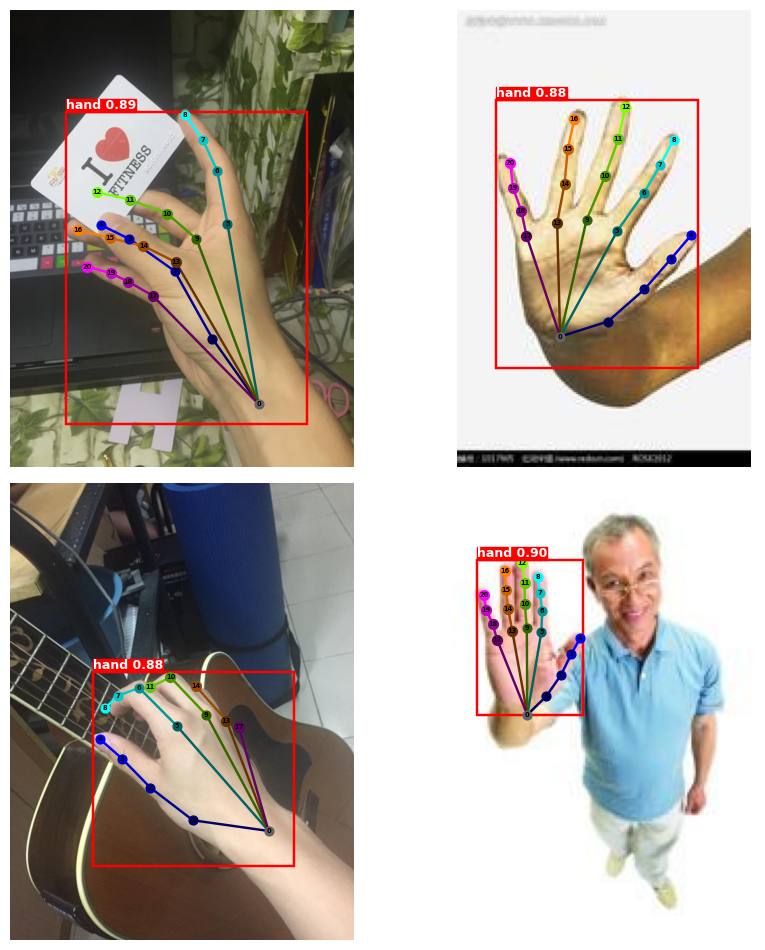

In [ ]:
visualizer.image_inference(test_image_paths, save_path="HandPoseEstimation_YOLO11s_OneHand10K_1.png")

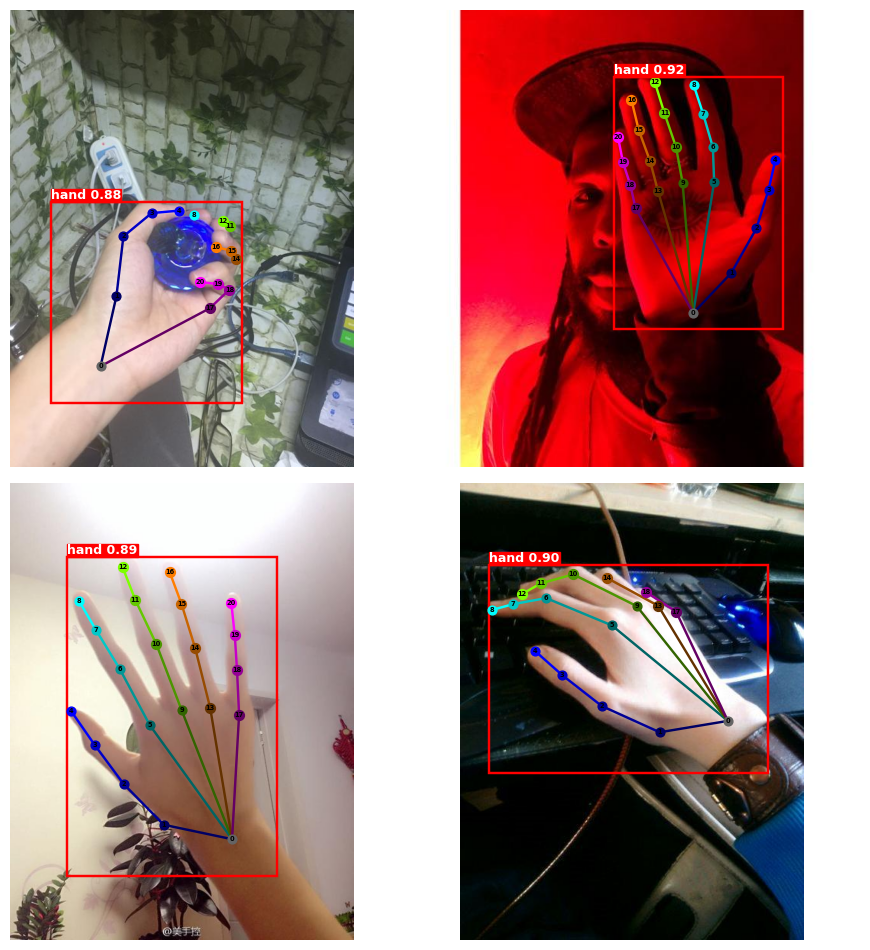

In [ ]:
visualizer.image_inference(test_image_paths)

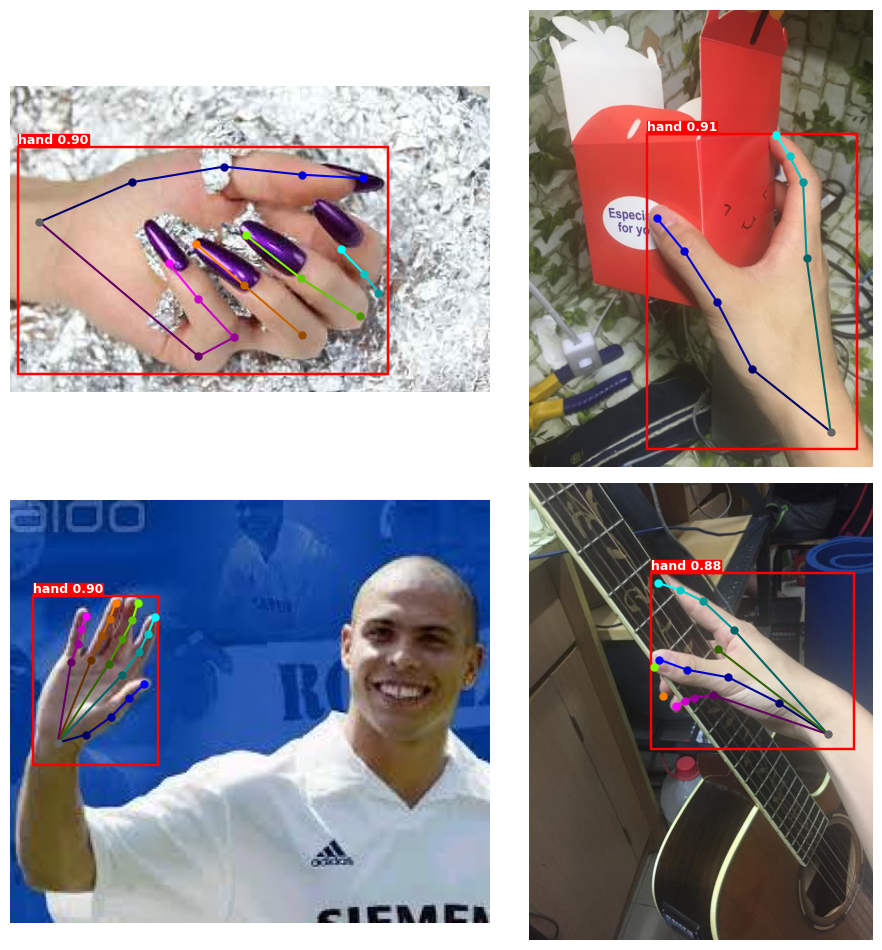

In [ ]:
visualizer.image_inference(test_image_paths, show_kpts_ids=False)

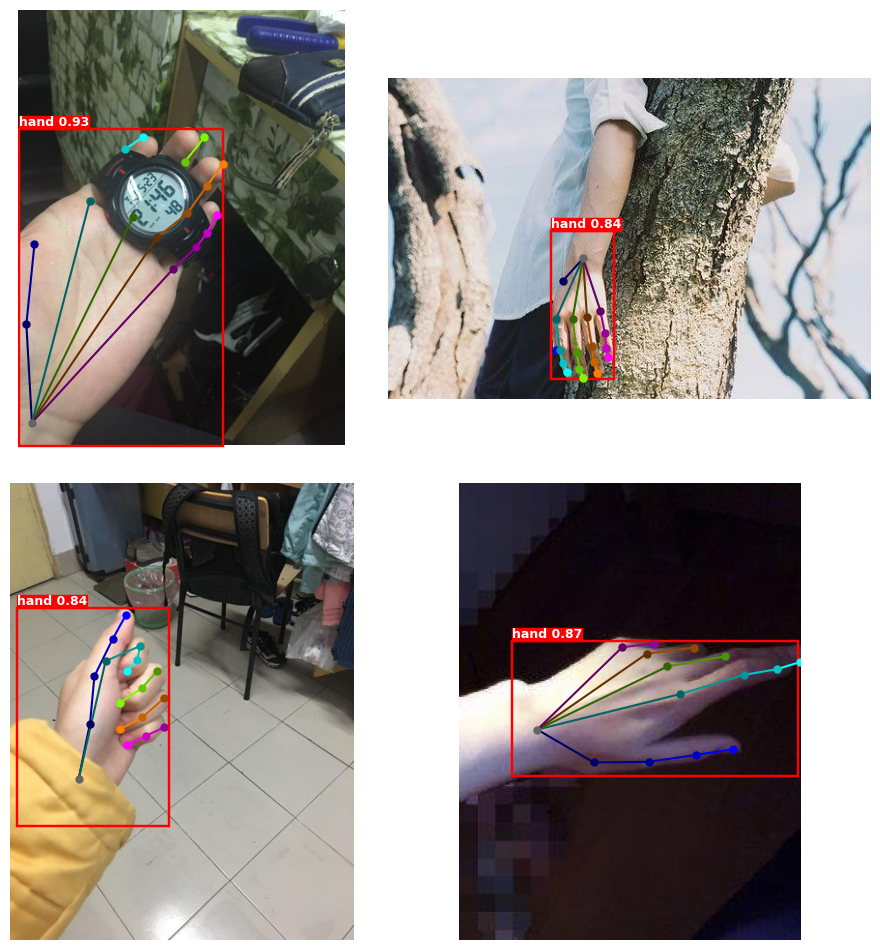

In [ ]:
visualizer.image_inference(test_image_paths, show_kpts_ids=False)

### **Internet Images**

In [17]:
list_urls = [
    "https://thumbs.dreamstime.com/b/man-making-pledge-gesture-hand-chest-promise-portrait-happy-asian-holding-heart-against-blue-background-165984496.jpg",
    "https://i.pinimg.com/736x/e5/c7/10/e5c710c8409964259a9905204132cf43.jpg",
    "https://media.istockphoto.com/id/174919533/photo/young-female-hand-show-five-fingers.jpg?s=612x612&w=0&k=20&c=vmqcClE_OtOO_i1I1b2szyGysIielqdQCbZR4P0UeGc=",
    "https://img.freepik.com/fotos-gratis/um-medico-derramando-xarope-para-alguem-vista-lateral_176474-1876.jpg?semt=ais_hybrid&w=740&q=80"
]

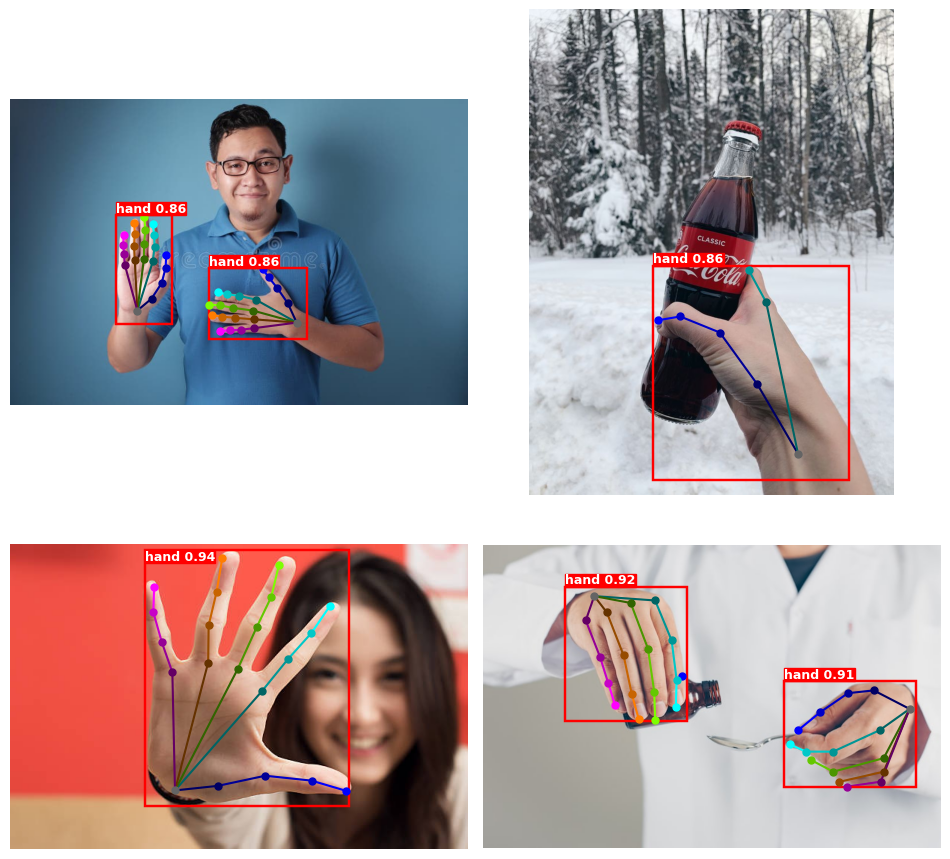

In [35]:
visualizer.image_inference(
    list_urls, random=False, show_kpts_ids=False,
    save_path="HandPoseEstimation_YOLO11s_OneHand10K_2.png"
)

### **Video Inference**

In [19]:
video_urls = [
    "/content/drive/MyDrive/Videos/OneHand10K_1.mp4",
    "/content/drive/MyDrive/Videos/OneHand10K_2.mp4",
]

In [2]:
visualizer.video_inference(video_urls[0], "HandPoseEstimation_YOLO11s_OneHand10K_1.mp4", show_kpts_ids=False)

In [4]:
visualizer.video_inference(video_urls[1], "HandPoseEstimation_YOLO11s_OneHand10K_2.mp4", show_kpts_ids=False)

## **Conclusion**

The **YOLO11s-pose** model fine-tuned on the **OneHand10K** dataset shows outstanding performance on the test set. For hand detection, it achieves a $\text{mAP}^{\text{box}}_{50}$ of **0.995** and a $\text{mAP}^{\text{box}}_{50–95}$ of **0.816**, indicating that the detector accurately localizes virtually every hand, with a natural decrease in $\text{mAP}^{\text{box}}_{50–95}$ due to stricter **IoU** thresholds.

For pose estimation, the results are similarly strong: the model reaches a $\text{mAP}^{\text{pose}}_{50}$ of **0.954** and a $\text{mAP}^{\text{pose}}_{50–95}$ of **0.519**, showing that the vast majority of the **21 keypoints** per hand are correctly predicted and localized. The drop in $\text{mAP}^{\text{pose}}_{50–95}$ is expected, as higher **OKS** thresholds penalize even minor deviations in keypoint coordinates, especially given natural variation in hand articulation, occlusion, and positioning.

Inference also confirms that the model can detect and estimate the pose of multiple hands in a single image, despite **OneHand10K** containing only one hand per sample. To further improve performance particularly for complex multi-hand scenarios expanding the training dataset with additional annotated images of multiple hands and diverse conditions would be beneficial. Nonetheless, for most practical applications, the model already delivers high-level accuracy and robustness in **hand pose estimation**, whether for one or several hands per image.